# Latent space models on networks

In [1]:
import sys
import os
sys.path.append(os.path.abspath(".."))


from LSMN_P import * 

## Network

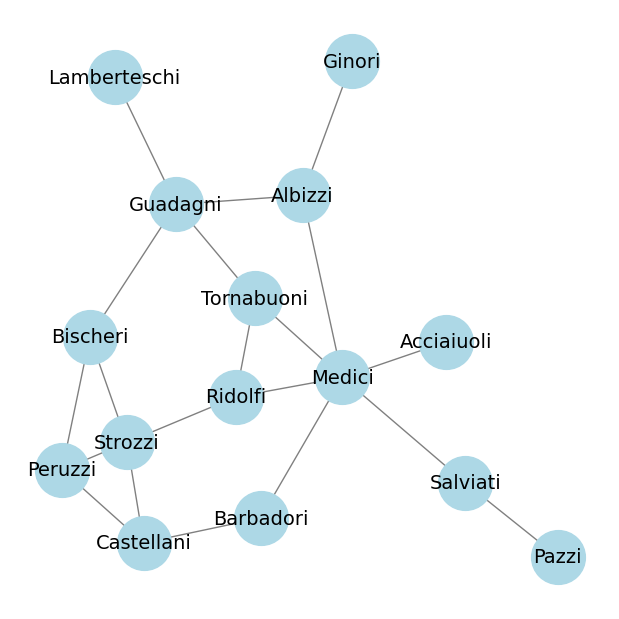

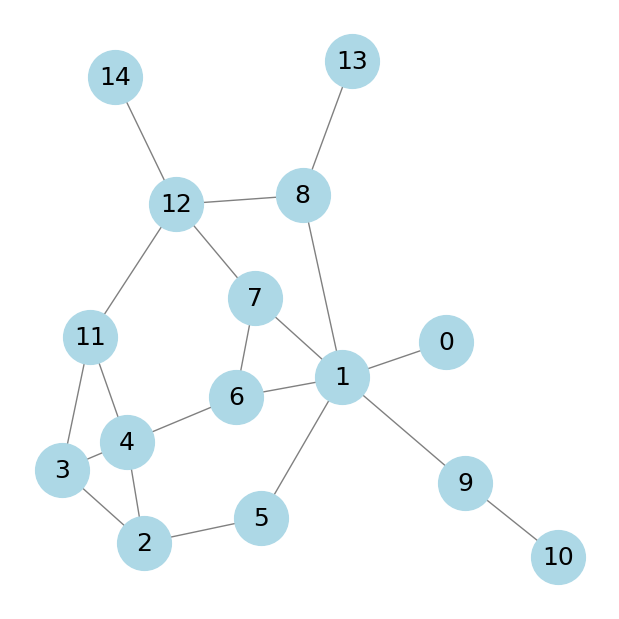

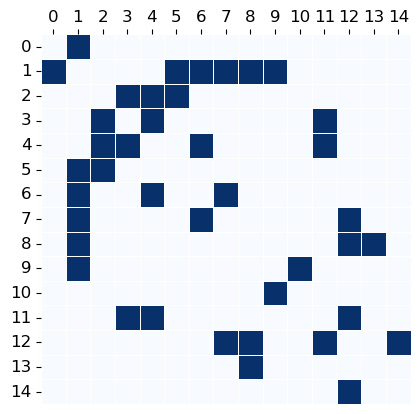

In [2]:
G = nx.florentine_families_graph()
pos = nx.spring_layout(G, seed=80)
plt.figure(figsize=(6,6))
nx.draw(G, pos=pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=1500, font_size=14)
#plt.title("Florentine Families network")
plt.show()

G = nx.florentine_families_graph()
node_mapping = {node: i for i, node in enumerate(G.nodes())}
G = nx.relabel_nodes(G, node_mapping)
n = len(G.nodes)
plt.figure(figsize=(6,6))
pos_relabel = {node_mapping[k]: v for k, v in pos.items()}
nx.draw(G,  pos=pos_relabel, with_labels=True, node_color='lightblue', edge_color='gray', node_size=1500, font_size=18)
#plt.title("Florentine Families network with relabeled nodes")
plt.show()
#print("Map from original nodes to new nodes:")
#print(node_mapping)

Y = nx.to_numpy_array(G, dtype=float)

sns.heatmap(Y, annot=False, cmap="Blues", cbar=False, square=True, linewidths=0.5, linecolor='white')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.gca().xaxis.tick_top() 
plt.gca().tick_params(top=True, bottom=False, labeltop=True, labelbottom=False, labelsize=12)
#plt.title("Sociomatrix for Florentine families")
plt.show() 

In [3]:
resultsR2 = handle_results(filepath='resultsR2.pkl', mode='load')
resultsR3 = handle_results(filepath='resultsR3.pkl', mode='load')
resultsS1 = handle_results(filepath='resultsS1.pkl', mode='load')
resultsS2 = handle_results(filepath='resultsS2.pkl', mode='load')

results_dict = {
    'R2': resultsR2,
    'R3': resultsR3,
    'S1': resultsS1,
    'S2': resultsS2
}

Results successfully loaded from: resultsR2.pkl
Results successfully loaded from: resultsR3.pkl
Results successfully loaded from: resultsS1.pkl
Results successfully loaded from: resultsS2.pkl


In [ ]:
df_comparison = model_comparison(results_dict)
df_comparison

,Model,WAIC,DIC,BIC,mean_log_likelihood,Min_Rhat,Max_Rhat,Min_ESSn,Max_ESSn,ROC_AUC,...,False positive,False negative,p_value_density,p_value_transitivity,p_value_assortativity,p_value_average_degree,p_value_degree_sd,p_value_average_path_length,p_value_diameter,p_value_modularity
0,Euclidean_R2,158.508029,151.562050,258.037966,-31.556751,0.9999,1.0001,0.6324,0.7456,0.880000,...,2,7,0.9590,0.9136,0.938375,0.7582,0.5946,0.2762,0.6560,0.1683
1,Euclidean_R3,161.099441,150.191409,292.078660,-27.642636,0.9999,1.0008,0.4437,0.5885,0.913529,...,3,4,0.9581,0.9652,0.972700,0.8990,0.7135,0.2591,0.6657,0.2025
3,Spherical_S2,241.737656,185.710157,247.080198,-30.555712,0.9999,1.0005,0.3318,0.9896,0.991176,...,3,2,0.9967,0.9981,0.989800,0.9955,0.1571,0.1670,0.4876,0.2370
2,Spherical_S1,298.304531,240.572840,254.729953,-45.883516,0.9999,1.0003,0.7986,1.0000,0.948824,...,2,5,0.9936,0.9930,0.971100,0.9876,0.2914,0.2628,0.5104,0.3977


# Diagnostics

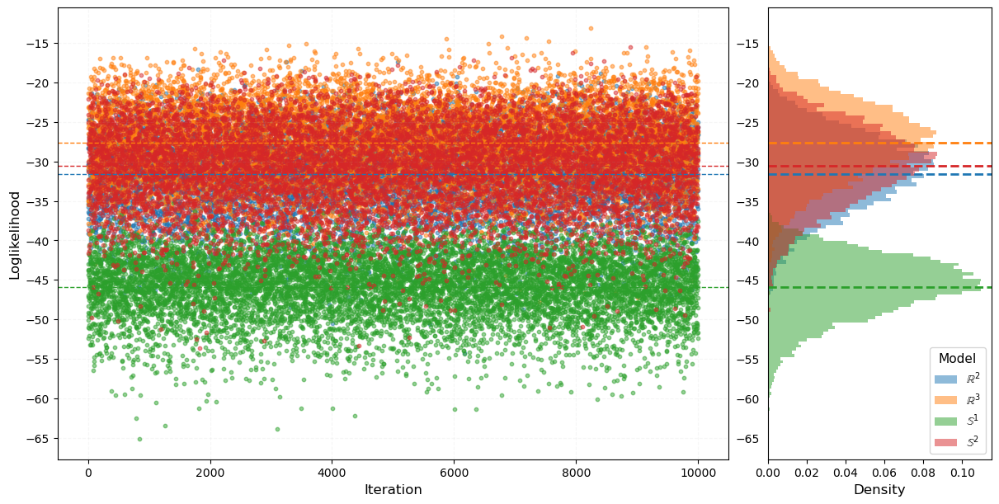

In [4]:
plot_loglikelihood_comparison(results_dict)

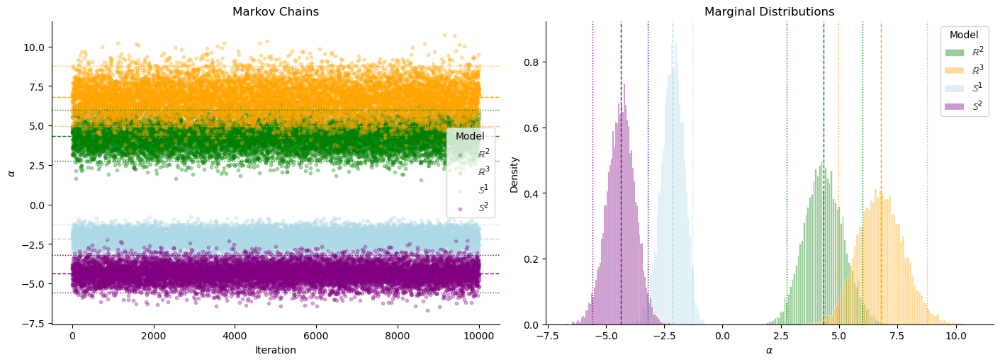

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Diccionario de modelos y colores
model_data = {
    r'$\mathbb{R}^2$': (resultsR2['samples']['alpha'], 'green'),
    r'$\mathbb{R}^3$': (resultsR3['samples']['alpha'], 'orange'),
    r'$\mathbb{S}^1$': (resultsS1['samples']['alpha'], 'lightblue'),
    r'$\mathbb{S}^2$': (resultsS2['samples']['alpha'], 'purple')
}

# Crear figura
fig, axes = plt.subplots(1, 2, figsize=(14, 5), constrained_layout=True)

# Trazas
for label, (x, color) in model_data.items():
    iterations = np.arange(1, len(x) + 1)
    mean_x = np.mean(x)
    q025, q975 = np.quantile(x, [0.025, 0.975])

    # Trazas por modelo
    axes[0].scatter(iterations, x, alpha=0.3, s=10, label=label, color=color)
    axes[0].axhline(mean_x, color=color, linestyle='--', linewidth=1)
    axes[0].axhline(q025, color=color, linestyle=':', linewidth=1)
    axes[0].axhline(q975, color=color, linestyle=':', linewidth=1)

    # Histogramas por modelo
    sns.histplot(x, bins=75, kde=False, stat='density', color=color,
                 edgecolor='white', alpha=0.4, label=label, ax=axes[1])
    axes[1].axvline(mean_x, color=color, linestyle='--', linewidth=1)
    axes[1].axvline(q025, color=color, linestyle=':', linewidth=1)
    axes[1].axvline(q975, color=color, linestyle=':', linewidth=1)

# Estética trace plot
axes[0].set_xlabel("Iteration")
axes[0].set_ylabel(r"$\alpha$")
axes[0].set_title("Markov Chains")
axes[0].legend(title="Model")
sns.despine(ax=axes[0])

# Estética histograma
axes[1].set_xlabel(r"$\alpha$")
axes[1].set_ylabel("Density")
axes[1].set_title("Marginal Distributions")
axes[1].legend(title="Model")
sns.despine(ax=axes[1])

plt.show()


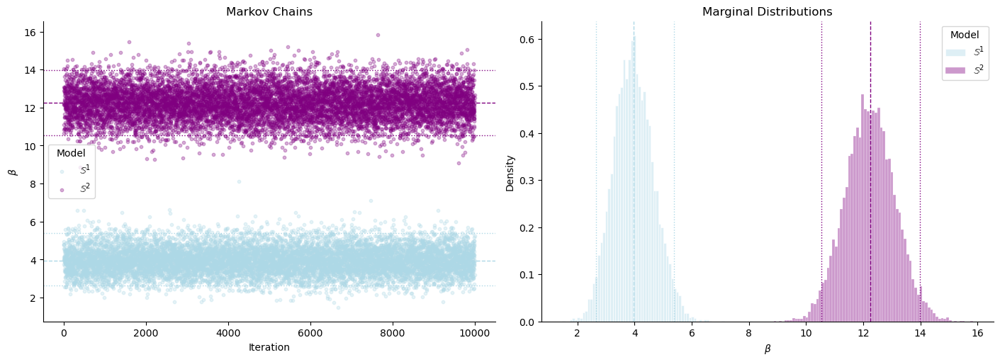

In [6]:
model_data_beta = {
    r'$\mathbb{S}^1$': (resultsS1['samples']['beta'], 'lightblue'),
    r'$\mathbb{S}^2$': (resultsS2['samples']['beta'], 'purple')
}

fig, axes = plt.subplots(1, 2, figsize=(14, 5), constrained_layout=True)

for label, (x, color) in model_data_beta.items():
    iterations = np.arange(1, len(x) + 1)
    mean_x = np.mean(x)
    q025, q975 = np.quantile(x, [0.025, 0.975])

    axes[0].scatter(iterations, x, alpha=0.3, s=10, label=label, color=color)
    axes[0].axhline(mean_x, color=color, linestyle='--', linewidth=1)
    axes[0].axhline(q025, color=color, linestyle=':', linewidth=1)
    axes[0].axhline(q975, color=color, linestyle=':', linewidth=1)

    sns.histplot(x, bins=75, kde=False, stat='density', color=color,
                    edgecolor='white', alpha=0.4, label=label, ax=axes[1])
    axes[1].axvline(mean_x, color=color, linestyle='--', linewidth=1)
    axes[1].axvline(q025, color=color, linestyle=':', linewidth=1)
    axes[1].axvline(q975, color=color, linestyle=':', linewidth=1)

axes[0].set_xlabel("Iteration")
axes[0].set_ylabel(r"$\beta$")
axes[0].set_title("Markov Chains")
axes[0].legend(title="Model")
sns.despine(ax=axes[0])

axes[1].set_xlabel(r"$\beta$")
axes[1].set_ylabel("Density")
axes[1].set_title("Marginal Distributions")
axes[1].legend(title="Model")
sns.despine(ax=axes[1])

plt.show()


# Visualization of latent spaces

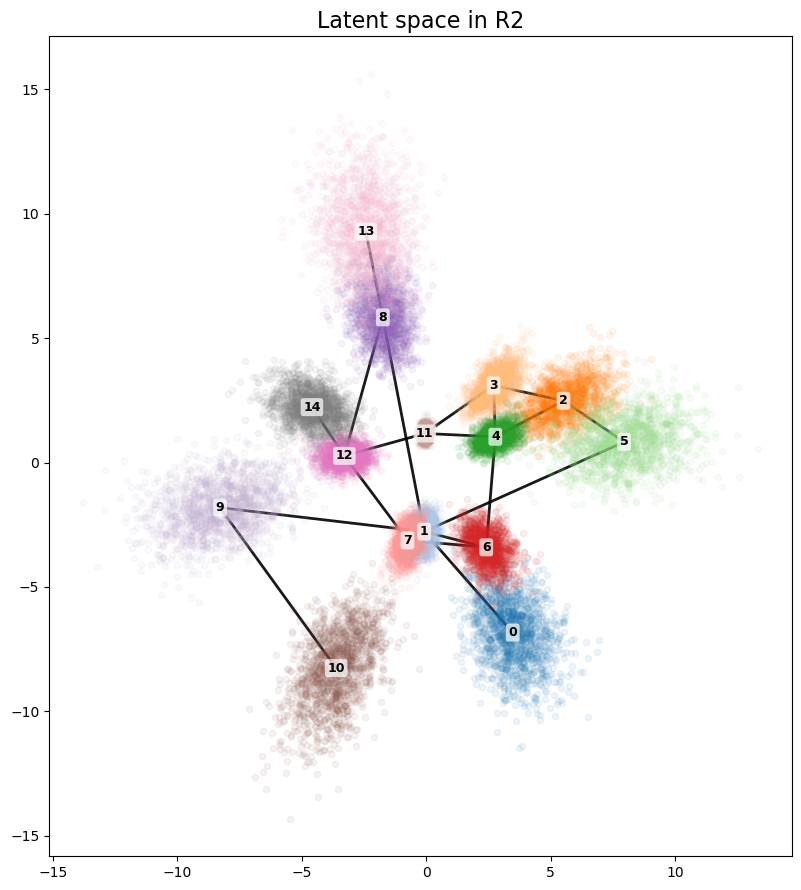

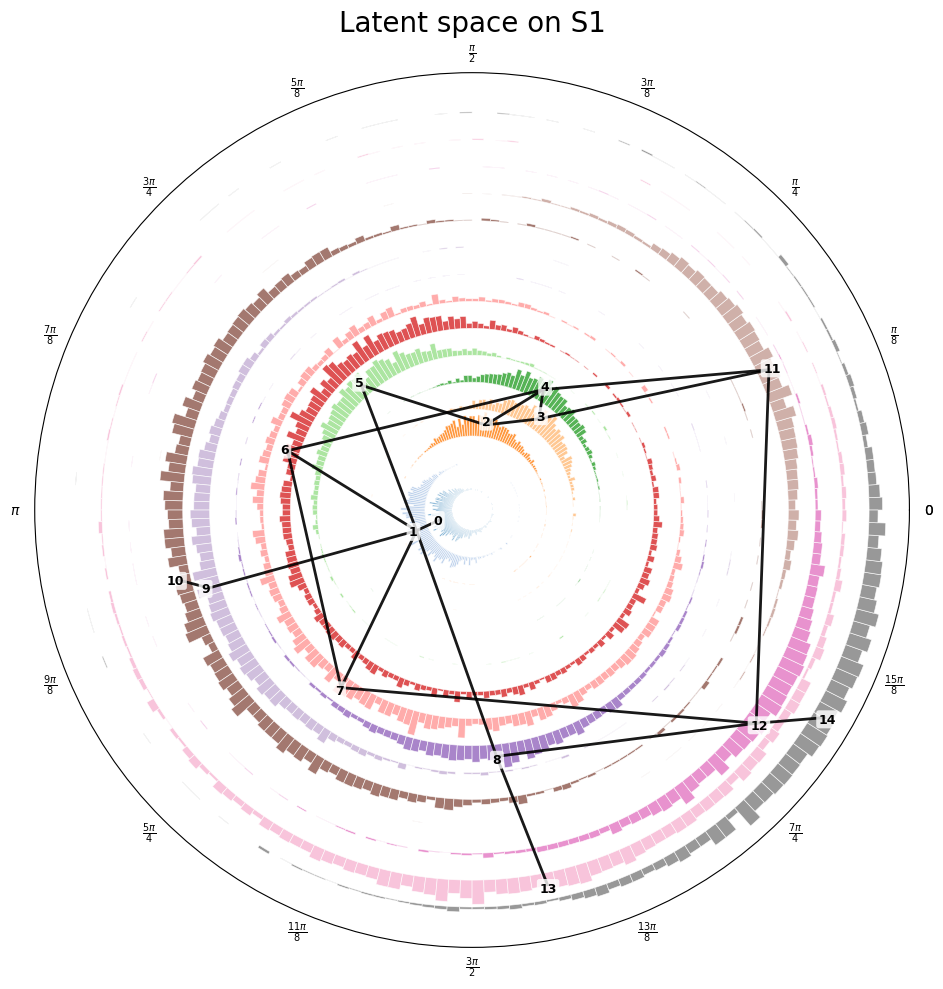

In [5]:
plot_latent_space(resultsR2)
plot_latent_space(resultsR3)
plot_latent_space(resultsS1)
plot_latent_space(resultsS2)

# Predictive checks
Posterior predictive checks (network statistics, p-values and sociomatrix) and prior predictive checks (sociomatrix)

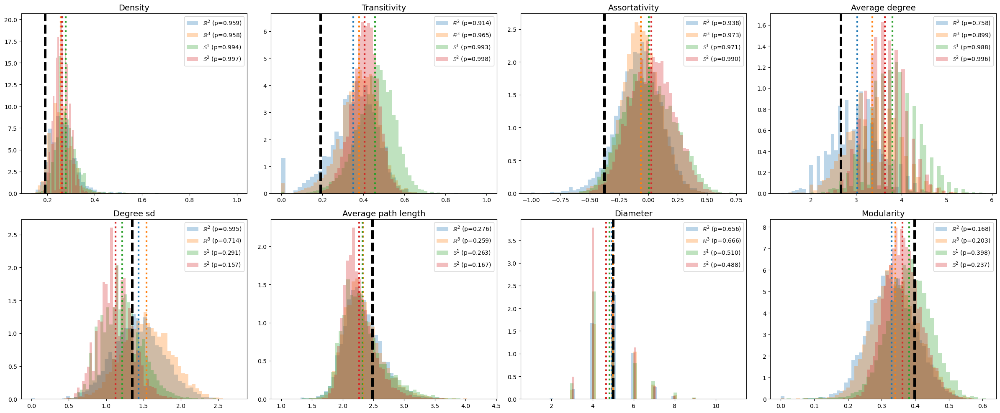

In [5]:
compare_posterior_predictive_checks(results_dict)

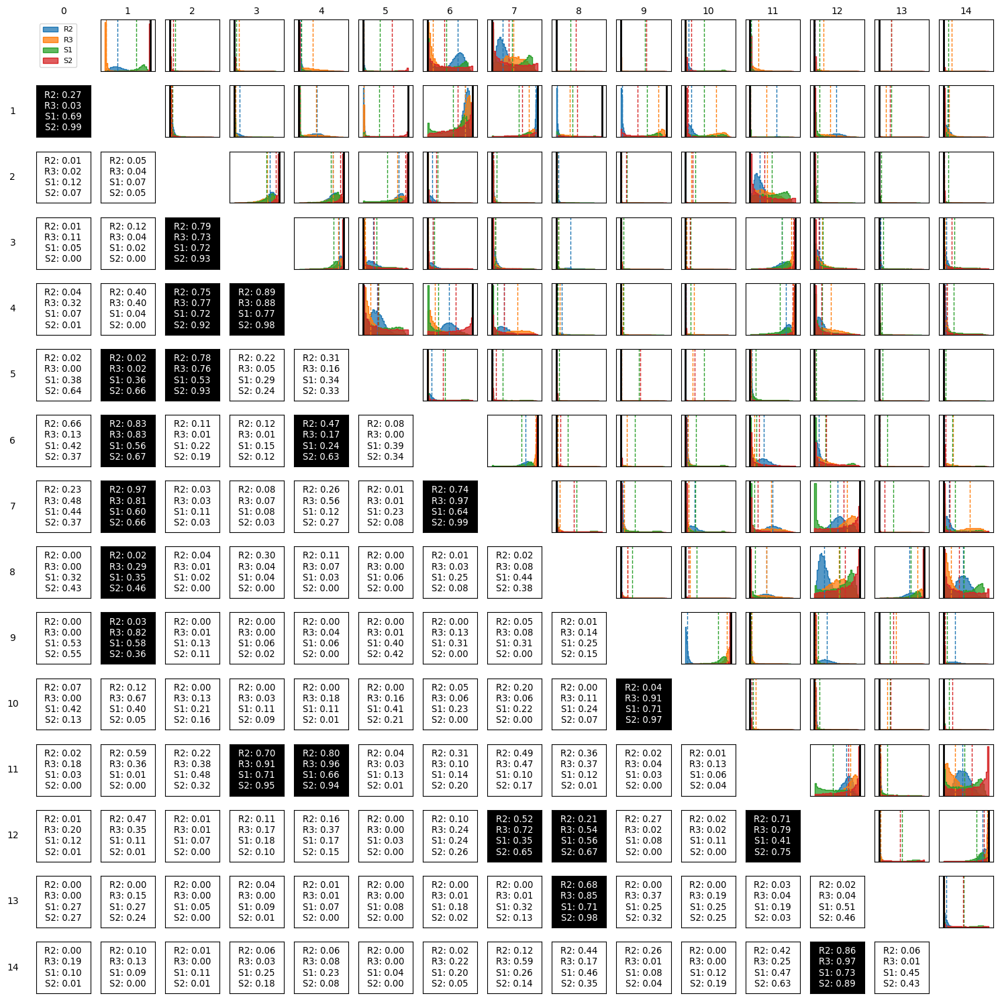

In [6]:
pairwise_sociomatrix_plot_all_models(results_dict)

# Prediction evaluation
ROC curve and prediction statistics

Model: Euclidean (R2)
Confusion matrix: tp=13, tn=83, fp=2, fn=7
AUC: 0.8800 | Accuracy: 0.9143 | Precision: 0.8667
Recall: 0.6500 | F1-score: 0.7429 | Specificity: 0.9765
Model: Euclidean (R3)
Confusion matrix: tp=16, tn=82, fp=3, fn=4
AUC: 0.9135 | Accuracy: 0.9333 | Precision: 0.8421
Recall: 0.8000 | F1-score: 0.8205 | Specificity: 0.9647
Model: Spherical (S1)
Confusion matrix: tp=15, tn=83, fp=2, fn=5
AUC: 0.9488 | Accuracy: 0.9333 | Precision: 0.8824
Recall: 0.7500 | F1-score: 0.8108 | Specificity: 0.9765
Model: Spherical (S2)
Confusion matrix: tp=18, tn=82, fp=3, fn=2
AUC: 0.9912 | Accuracy: 0.9524 | Precision: 0.8571
Recall: 0.9000 | F1-score: 0.8780 | Specificity: 0.9647


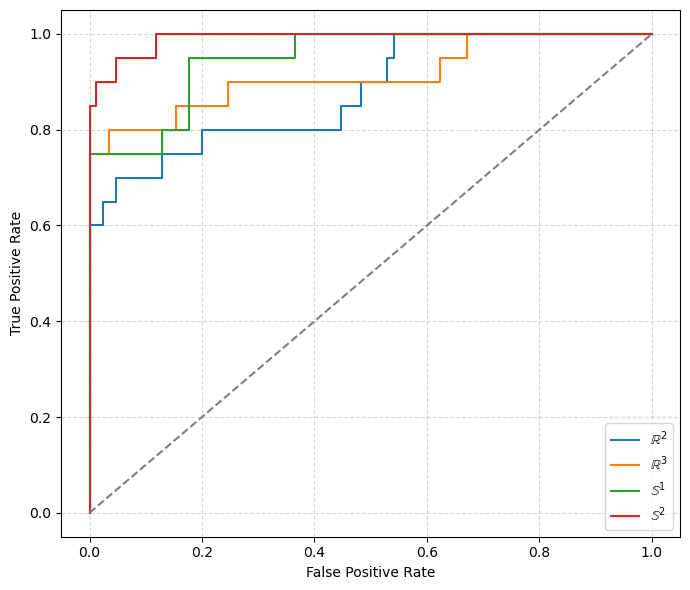

,Model,AUC,Accuracy,Precision,Recall,F1,Specificity,TP,TN,FP,FN
0,R2,0.880000,0.914286,0.866667,0.65,0.742857,0.976471,13,83,2,7
1,R3,0.913529,0.933333,0.842105,0.80,0.820513,0.964706,16,82,3,4
2,S1,0.948824,0.933333,0.882353,0.75,0.810811,0.976471,15,83,2,5
3,S2,0.991176,0.952381,0.857143,0.90,0.878049,0.964706,18,82,3,2


In [7]:
df_metrics = compare_prediction_evaluation(results_dict)
df_metrics

# Variance per node

In [8]:
latent_variance(results_dict)

,R2,R3,S1,S2
0,2.471930,4.916307,0.482284,0.104822
1,0.303841,0.977448,0.417934,0.048493
2,1.547192,3.955573,0.219254,0.075811
3,0.673811,3.032078,0.181132,0.089521
4,0.374705,0.830731,0.133306,0.066071
5,2.815266,7.158162,0.307783,0.069465
6,0.747907,2.939997,1.450305,0.049157
7,0.402707,1.439771,1.242903,0.051468
8,1.516923,3.314278,0.345157,0.070236
9,3.127223,3.595180,0.380930,0.097384


# Centrality

In [10]:
centrality_analysis({
    'R2': resultsR2,
    'R3': resultsR3,
    'S1': resultsS1,
    'S2': resultsS2
})

{'R2':     degree  closeness  probability connection  mean distance  center distance
 0      1.0   0.368421                0.155137       8.871853         1.375078
 1      6.0   0.560000                0.332080       5.857608         0.479940
 2      3.0   0.388889                0.252027       7.594357         1.088175
 3      3.0   0.368421                0.295517       6.462347         0.714281
 4      4.0   0.437500                0.350349       5.927822         0.535996
 5      2.0   0.437500                0.164334       9.097119         1.472553
 6      3.0   0.500000                0.299336       6.512839         0.757306
 7      3.0   0.482759                0.312444       6.053650         0.551802
 8      3.0   0.482759                0.211951       7.730594         1.075657
 9      2.0   0.388889                0.110720       9.678588         1.550674
 10     1.0   0.285714                0.099484      10.000833         1.547003
 11     3.0   0.400000                0.379116

# Clustering

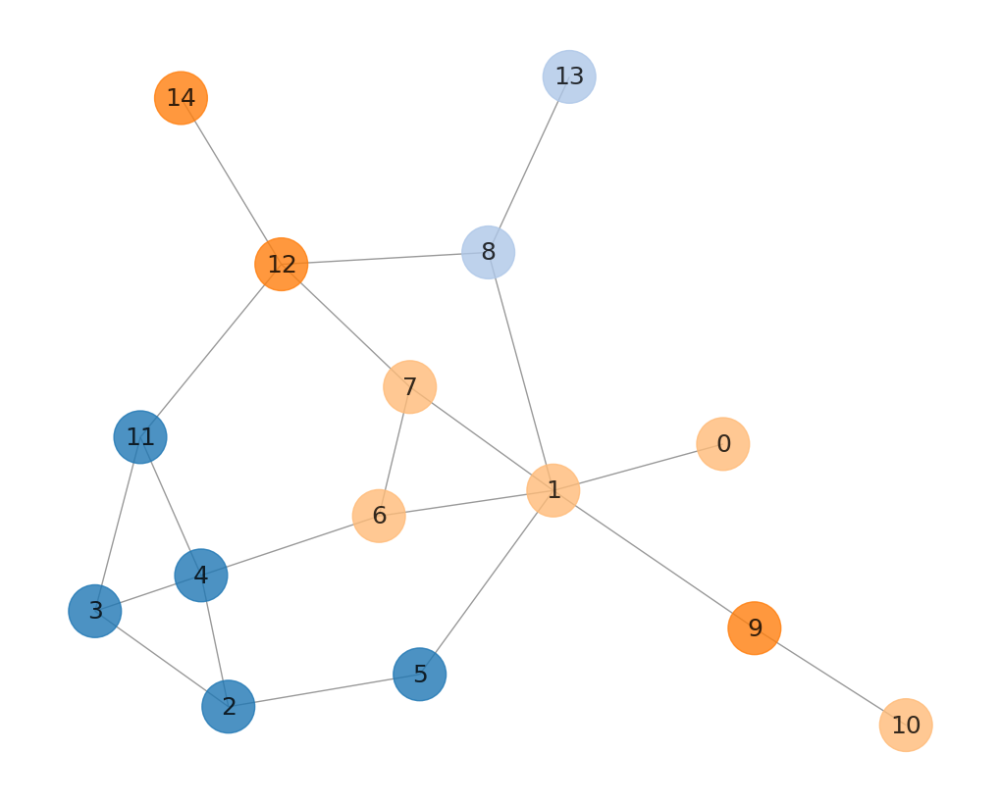

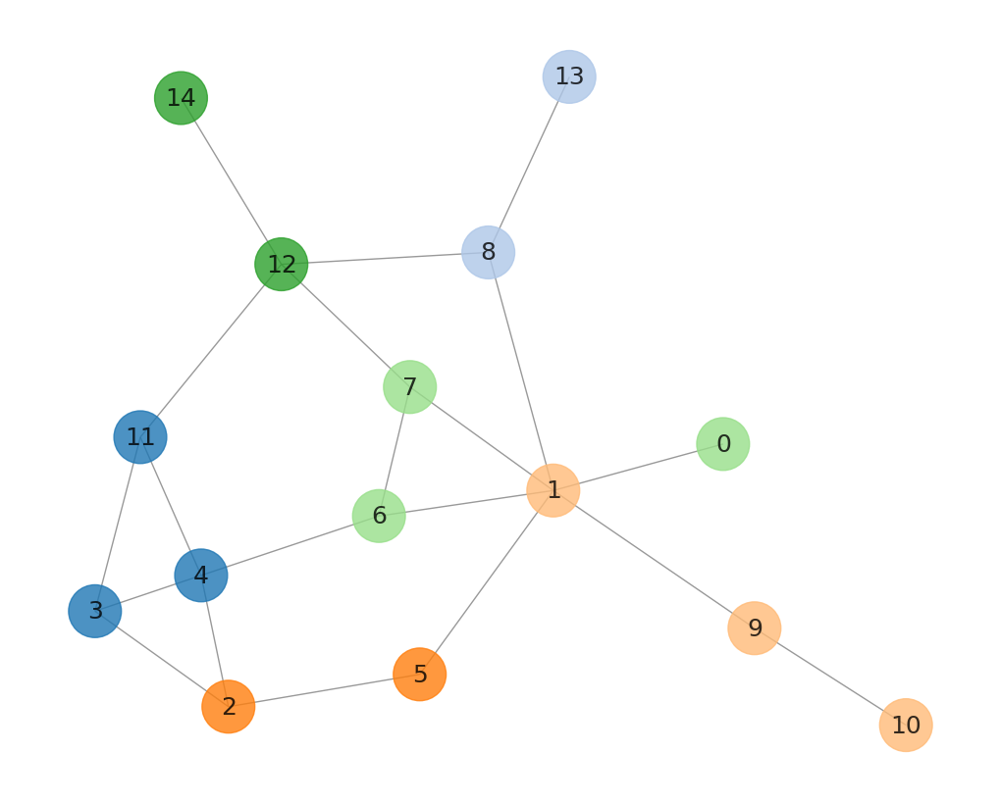

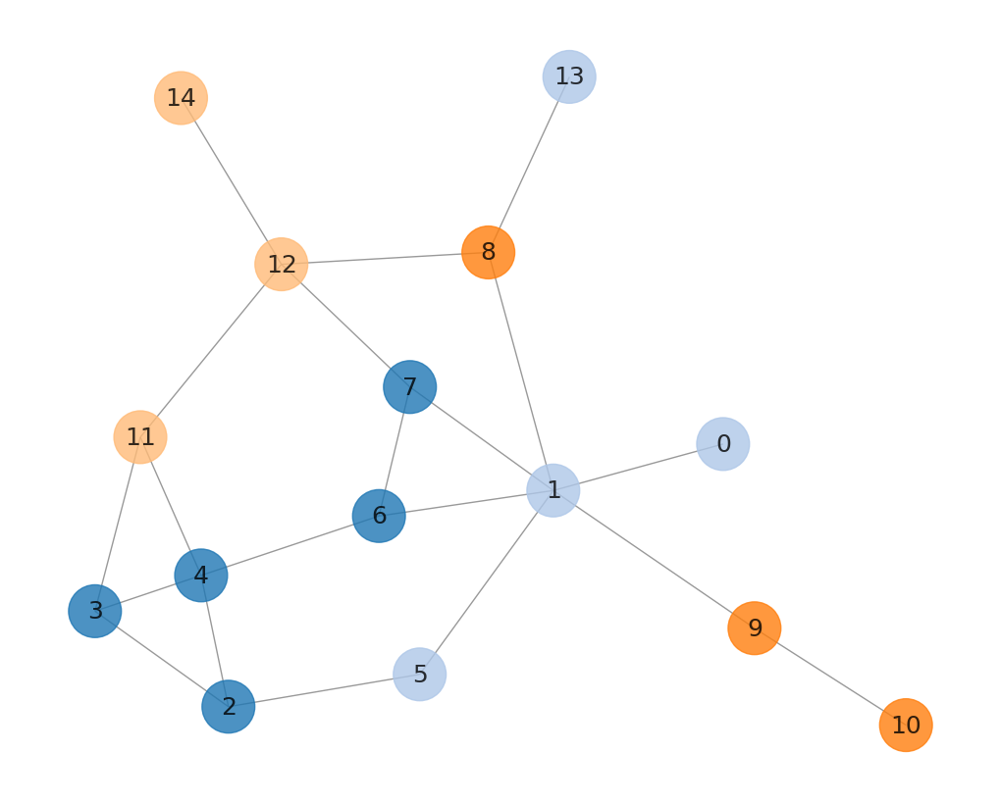

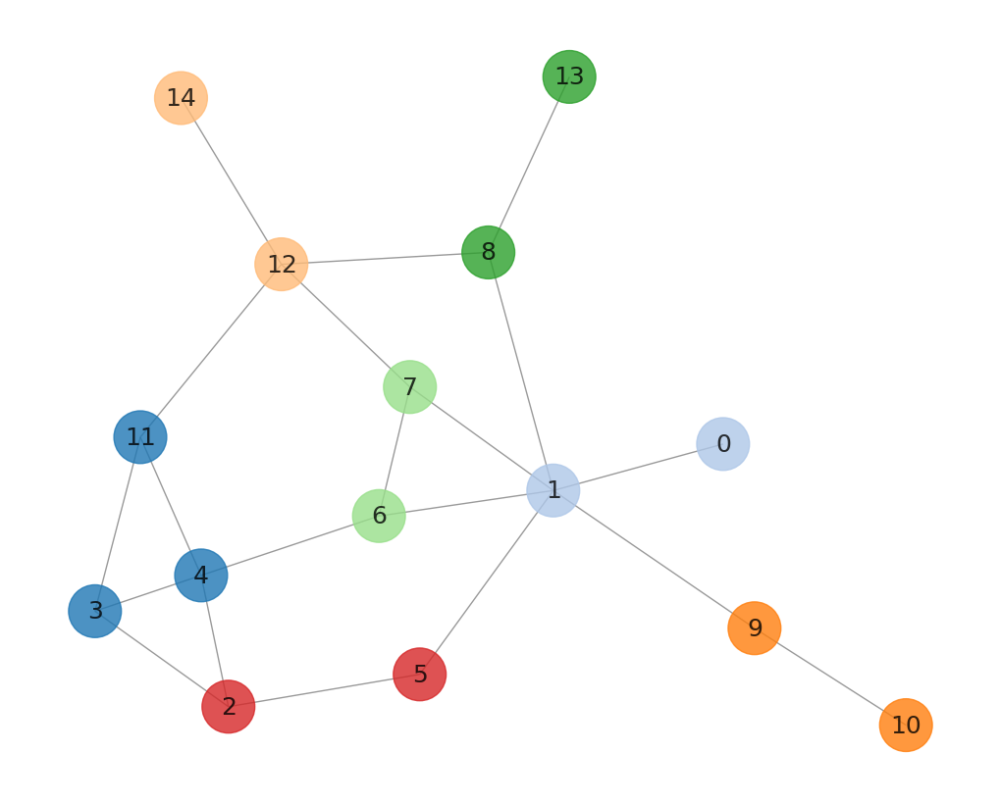

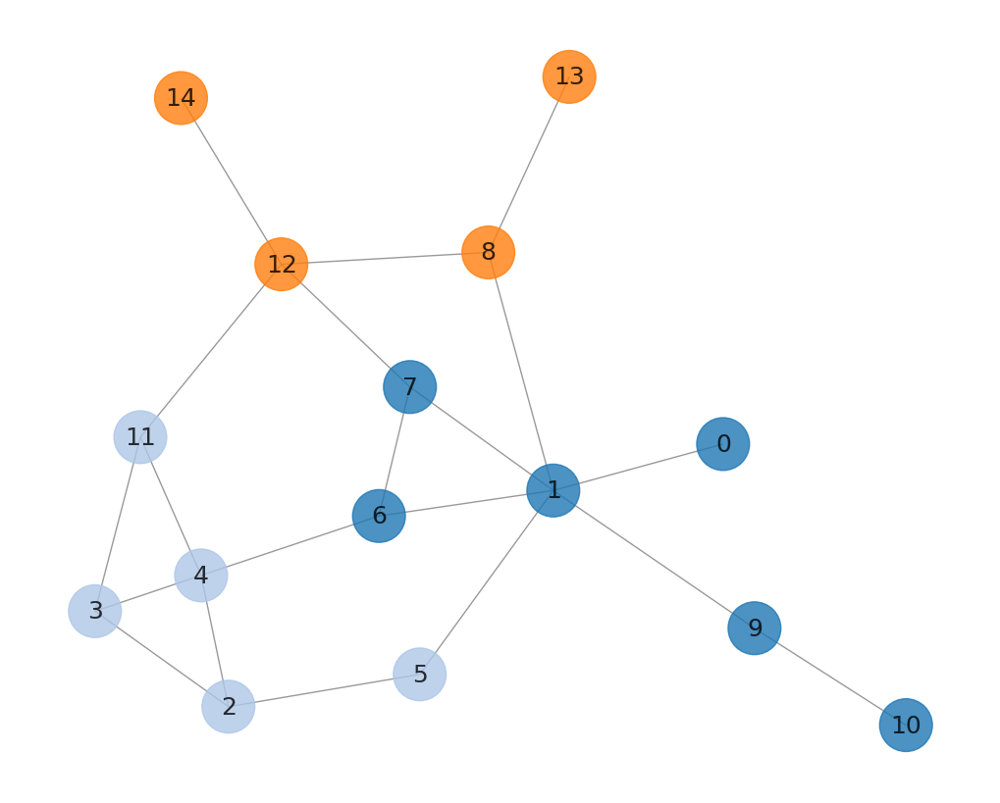

,Model,k,modularity
0,R2,4,0.09750
1,R3,6,0.22000
2,S1,4,0.14000
3,S2,7,0.28750
4,Observed,3,0.39875


In [12]:
latent_clustering(results_dict,range(2,8))
